References:  
- [1811.12907 ArXiv paper with LIGO plots](https://arxiv.org/pdf/1811.12907.pdf)
- [GWpy tutorials](https://github.com/gw-odw/odw-2020/tree/master/Day_1) [[More tutorials](https://github.com/gw-odw/odw-2020)]
- [LIGO open data workshop](https://www.gw-openscience.org/static/workshop3/)
- [GWpy signal filtering](https://gwpy.github.io/docs/stable/examples/signal/gw150914.html)
- [Own article on HackMD](https://hackmd.io/klB-AaapTLC-Ls3yiXCMdA?both)

## Install Required Libraries:

- gwpy for Gravitational Wave analysis
- joypy for joy division style plots

Import libraries:
- `requests` to download data files
- `os` to access files saved in the local folder
- `pandas` to work with dataframes
- `numpy` to define arrays and do math
- `matplotlib` for graphs


Import Class `TimeSeries` to store & process LIGO data.

In [1]:
import requests, os
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'


from gwpy.timeseries import TimeSeriesDict
from gwpy.timeseries import TimeSeries
from gwpy.signal import filter_design


To import the Neutron Star and Black Hole collison data, we downloaded a `.csv` file from

 https://www.gw-openscience.org/eventapi/html/GWTC-1-confident/

 To that `.csv` we appended a couple of _off catalogue_ but notable events:

 https://www.gw-openscience.org/eventapi/html/O3_Discovery_Papers/

The file is in our shared keybase folder, and should be uploaded to the local colab folder.

## Idea:

By importing the `csv` file we can associate the event name wich each GPS time.



In [2]:
ligo_events = pd.read_csv('LIGO-Events-of-Interest.csv')
ligo_events.shape # how many events

# keep the two columns we need
name_n_time = ligo_events[["commonName", "GPS"]]

In [3]:
# round the Unix Timestamp so it has no decimals
# ignore warning
name_n_time["GPS"] = name_n_time["GPS"].apply(lambda x : round(x))

#-- Choose detector as H1, L1, or V1
detector = ['H1','L1','V1'] #Hanford, Livinston, Virgo

<ipython-input-3-ccddd9411b90>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  name_n_time["GPS"] = name_n_time["GPS"].apply(lambda x : round(x))


In [4]:
# Turn it into a key-value store (dictionary)
events_name_n_time = {}
for x in name_n_time.iterrows():
  di_name = x[1][0]
  di_time = x[1][1]
  events_name_n_time[di_time] = di_name

# events_name_n_time

## I've commented out downloads (as they are already done!)


In [5]:
from gwosc.locate import get_urls
full_event_list = []

for t0 in events_name_n_time: # loop over GPS times of events
  event_name = events_name_n_time[t0]
  print(event_name)
  for lab in detector:
    # keep in the list, the URL, the time, the name and the lab
    # the index "0" after get_urls(a,b,c)[0] selects the 32s files
    # index 1 selects a very long (and many MB) dataset
    try: # try to get data
        event_url = get_urls(lab,t0,t0)[0]
        full_event_list.append([event_url, event_name, t0, lab])
    except Exception as e: # if data is not there (Virgo did not have it)
        print(lab, ' data not available: ',e )
'''
for event_url in full_event_list:
  fn = "ligodata/{}-{}-{}.hdf5".format(event_url[1], event_url[2], event_url[3])
  with open(fn,'wb') as strainfile:                 
    straindata = requests.get(event_url[0]) # <-- remove comment to download
    print("Downloading ", fn)
    strainfile.write(straindata.content)  # <-- remove comment to download
'''


GW150914
V1  data not available:  Cannot find a LOSC dataset for V1 covering [1126259462, 1126259462)
GW151012
V1  data not available:  Cannot find a LOSC dataset for V1 covering [1128678900, 1128678900)
GW151226
V1  data not available:  Cannot find a LOSC dataset for V1 covering [1135136351, 1135136351)
GW170104
V1  data not available:  Cannot find a LOSC dataset for V1 covering [1167559937, 1167559937)
GW170608
V1  data not available:  Cannot find a LOSC dataset for V1 covering [1180922494, 1180922494)
GW170729
GW170809
GW170814
GW170817
GW170818
GW170823
GW190412
GW190521
GW190814


'\nfor event_url in full_event_list:\n  fn = "ligodata/{}-{}-{}.hdf5".format(event_url[1], event_url[2], event_url[3])\n  with open(fn,\'wb\') as strainfile:                 \n    straindata = requests.get(event_url[0]) # <-- remove comment to download\n    print("Downloading ", fn)\n    strainfile.write(straindata.content)  # <-- remove comment to download\n'

# Plotting subset of noisy data:
(Running this is optional)

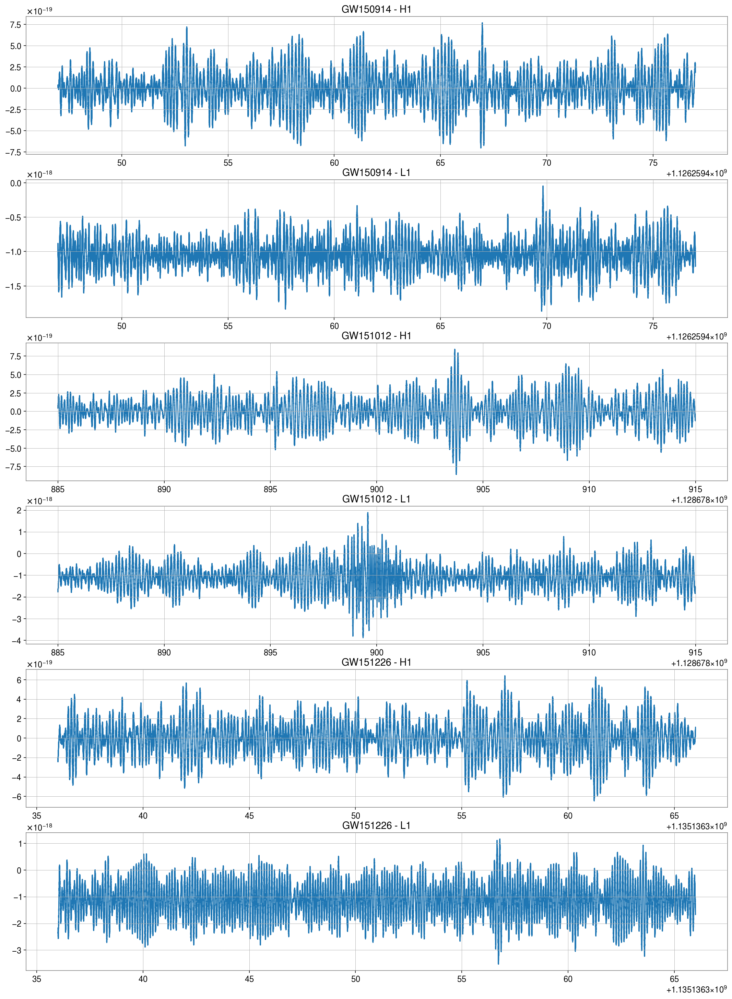

In [6]:
# Let's plot a subset of the data 


fig, ax = plt.subplots(6, figsize=(15,20))
fig.tight_layout(pad=1.0)

ind = 0

for ev in full_event_list[:6]:
  fn = "./ligodata/{}-{}-{}.hdf5".format(ev[1], ev[2], ev[3])
  strain = TimeSeries.read(fn,format='hdf5.losc' ) 
  center = int(ev[2])
  strain = strain.crop(center-15, center+15)
  ax[ind].plot(strain)
  ax[ind].title.set_text(ev[1] + ' - ' + ev[3]) # title is event & lab
  ind = ind + 1
    

## Whiten & Bandpass -> Plot
(just exploration, Optional)

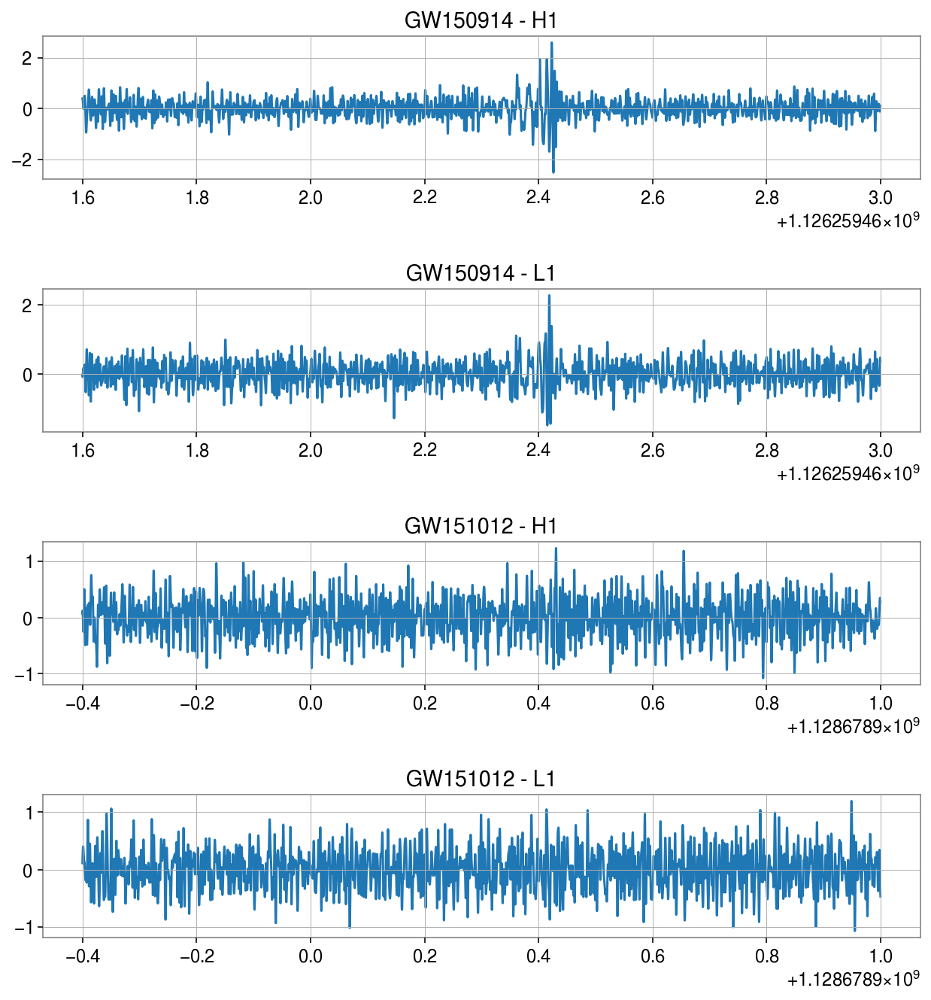

In [7]:

nr_plots = 4

fig, ax = plt.subplots(nr_plots, figsize=(10,10))
fig.tight_layout(pad=4.0)



for ind, ev in enumerate(full_event_list[:nr_plots]):
  fn = "ligodata/{}-{}-{}.hdf5".format(ev[1], ev[2], ev[3])
  strain = TimeSeries.read(fn,format='hdf5.losc' ) 
  white_data = strain.whiten()
  bp_data = white_data.bandpass(35, 350) # https://arxiv.org/pdf/1903.00546.pdf
  
  center = int(ev[2])
  cropped_bp = bp_data.crop(center-0.4, center+1)
  ax[ind].plot(cropped_bp)
  ax[ind].title.set_text(ev[1] + ' - ' + ev[3]) # title is event & lab
  ind = ind + 1

  

# Data Cleaning Strategy

Each event may have different high/low frequency filters, 
and may not be exactly centered around the "center"time.
Therefore, we will investigate & filter each event one by one
to obtain the best looking possible plot each time.

### Strategy 1: Use bandpass + whiten simply (tested but abandoned strategy)

### Strategy 2: Use instructions [here](https://gwpy.github.io/docs/stable/examples/signal/gw150914.html) (now function `clean_it_up()` and `plot_strain()`)

Filtering Function:

In [13]:
def clean_it_up(event_index, full_event_list, low_bandpass, high_bandpass):
    '''
    Cleans up 
    # based on: https://gwpy.github.io/docs/stable/examples/signal/gw150914.html
    :event_index int: chose event_index (a number between 0 and full_event_list)
    :full_event_list list: defined further up this notebook
    :low_bandpass int: lower cut for frequencies (typically 30Hz - 50Hz)
    :high_bandpass int: higher cut for frequencies (typically 200Hz - 300Hz)
    :grid_frequency int: frequency of electrical grid (which induces noise in signal), 50Hz Europe, 60Hz US
    :return: filt_strain (a filtered TimeSeries object)
    
    '''
    ev = full_event_list[event_index]
    
    # chose file
    fn = "ligodata/{}-{}-{}.hdf5".format(ev[1], ev[2], ev[3])
    # get strain from file
    strain = TimeSeries.read(fn,format='hdf5.losc' )
    # banspass
    bp = filter_design.bandpass(low_bandpass, high_bandpass, strain.sample_rate)
    # remove electrical noise 60Hz
    lab = ev[3]
    if lab == 'H1' or lab == 'L1': # US lab
        notches = [filter_design.notch(line, strain.sample_rate) for \
           line in (59, 59.5, 60, 60.5, 61, 120, 180, 240)]
    if lab == 'V1': # EU Lab
        notches = [filter_design.notch(line, strain.sample_rate) for \
           line in (49, 49.5, 50, 50.5, 51, 98, 99, 100,101,102, 148, 149, 150, 151, 152, 200)]

    zpk = filter_design.concatenate_zpks(bp, *notches)
    filt_strain = strain.filter(zpk, filtfilt=True)

    filt_strain = filt_strain.crop(*filt_strain.span.contract(1))

    return filt_strain




function to plot filtered results & extract cuttoff values

In [14]:
def plot_strain(event_index, full_event_list, strain_timeseries, delta_L, delta_R):
    '''
    plot a filtered strain timeseries, and constrain the x-axis
    :event_index int: chose event_index (a number between 0 and full_event_list)
    :full_event_list list: defined further up this notebook
    :strain_timeseries TimeSeries() object: from gwpy
    :delta_L float: how far left from the center of the event to plot 
       (max of 16, since the whole time series is 32s long, 
       can be negative to move right of center)
    :delta_R float: how far right from the center of the event to plot 
    '''
    ev = full_event_list[event_index]
    lab = ev[3]
    event_name = ev[1]
    time_stamp = ev[2]

    if lab =='H1':
        colour = 'gwpy:ligo-hanford'
    if lab == 'L1':
        colour = 'gwpy:ligo-livingston'
    if lab == 'V1':
        colour = 'green'

    from gwpy.plot import Plot
    plot = Plot(strain_timeseries, figsize=[16,2.5], color=colour )
    ax = plot.axes[0]
    ax.set_title(event_name + ' - ' + lab)
    ax.set_ylabel('Amplitude [strain]')
    ax.set_xlim(time_stamp - delta_L, time_stamp + delta_R)
    ax.set_xscale('seconds', epoch=time_stamp)
    print("INTERVAL IS: ", delta_R + delta_L)

    return delta_L, delta_R

    plot.show()        

We discovered that some plots are shifted when plotted using the methods of the Timeseries objects.  However, not ALL plots are shifted.  What in the world is up with the data?  Due to this, we add the "plot_check" function below, to test the plots and know if a shift is necessary.

In [15]:
def plot_check(strain_series, delta_L, delta_R, shift_L=1.055, shift_R=1.02 ):
    half_way = int(len(strain_series)/2)
    one_sec = int(len(strain_series)/32)
    L = (delta_L)*(one_sec)
    R = (delta_R)*(one_sec) # (delta_R - shift_R)*(one_sec)
    
    sL = shift_L*one_sec
    sR = shift_R*one_sec
    
    interval = [int(half_way - L-sL), int(half_way + R -sR)]
    plt.figure(figsize=(15,2.5))
    plt.plot(strain_series[interval[0]:interval[1]])
    return shift_L, shift_R
    plt.show()

#### ✓ GW150914 H1 & L1

preliminary investigation of shifting:

In [16]:
mi = [0.13, 0.7] # <- small
me = [-0.925,-0.32] # <- big = 1.5x 

translate_left_point = -0.925-0.13
stretch_length = (0.7-0.13)/(-0.926+0.325)

In [17]:
translate_left_point, stretch_length

(-1.0550000000000002, -0.9484193011647254)

In [18]:
the_interesting_data = {}
# this will have as key: event-lab, for example: GW150915-H1
# and will store for each, a list with time-series, delta_L, delta_R, shift_L, shift_R

INTERVAL IS:  0.75
INTERVAL IS:  0.75


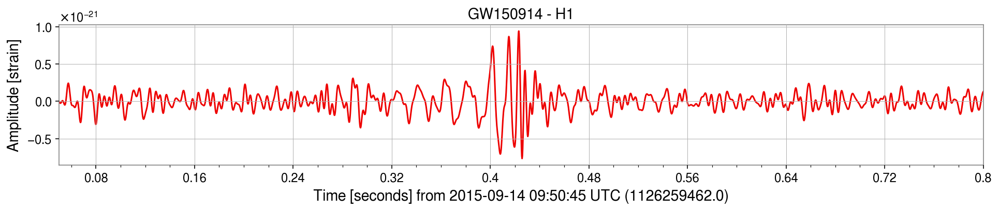

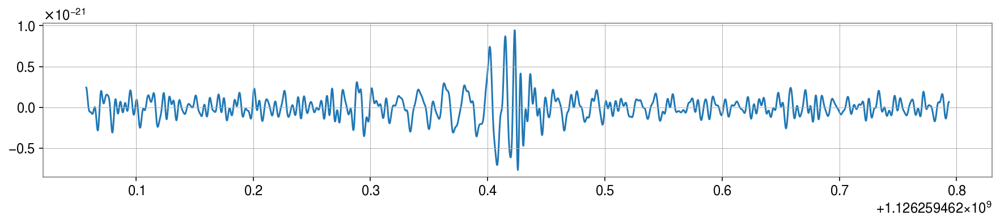

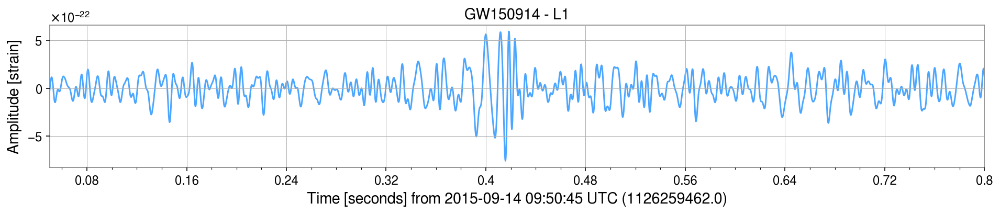

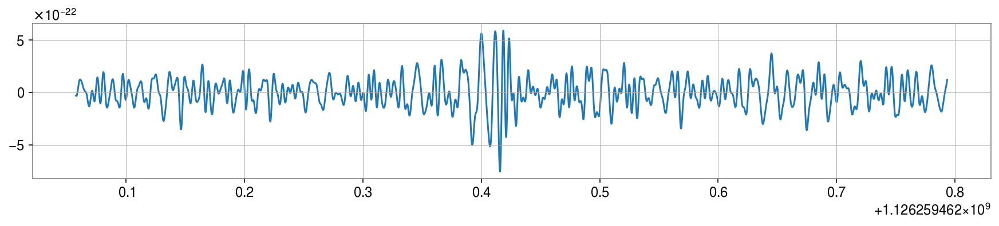

In [19]:
for i in [0,1]:
    s1 = clean_it_up(i, full_event_list, 50, 250)
    L,R = plot_strain(i, full_event_list, s1, -0.05, 0.8) 
    sL, sR = plot_check(s1, L, R )
    ev_name = '{}-{}'.format(full_event_list[i][1], full_event_list[i][3])
    the_interesting_data[ev_name] = [s1, L, R, sL, sR]


#### ✓ GW151012 H1 & L1

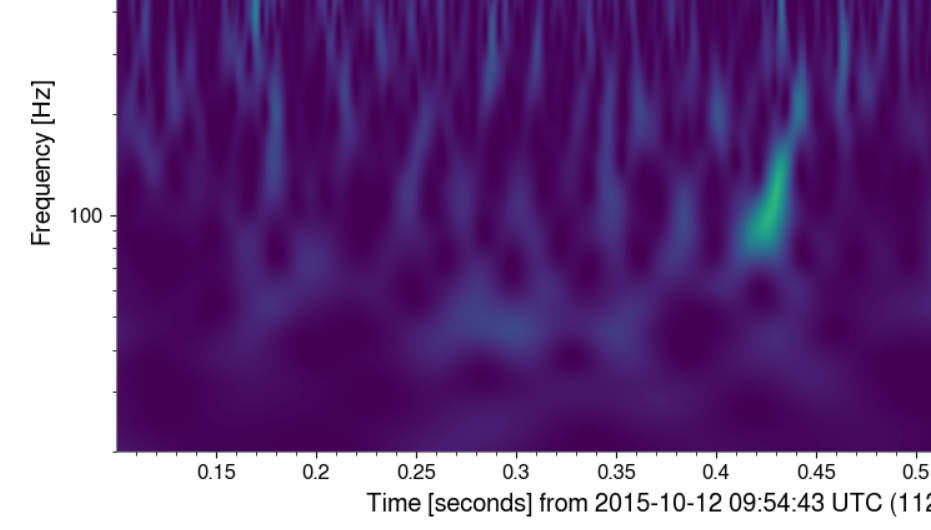

INTERVAL IS:  0.49999999999999994
INTERVAL IS:  0.49999999999999994


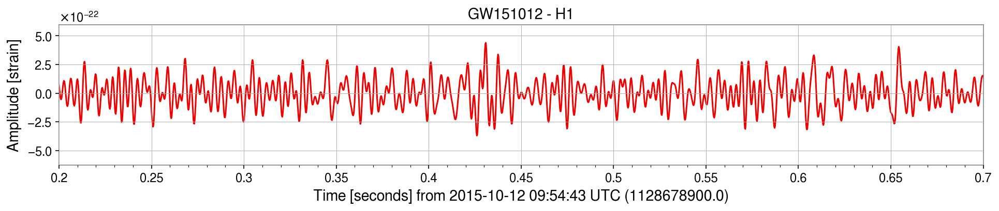

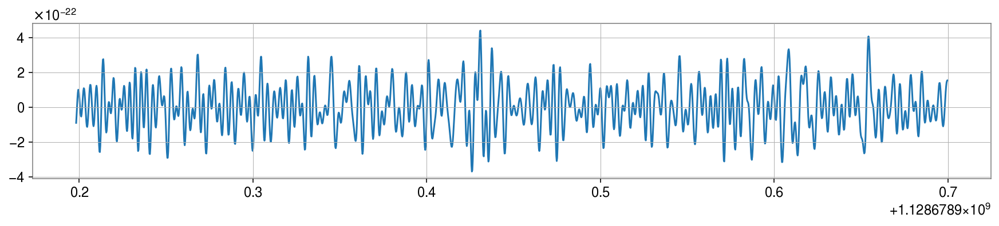

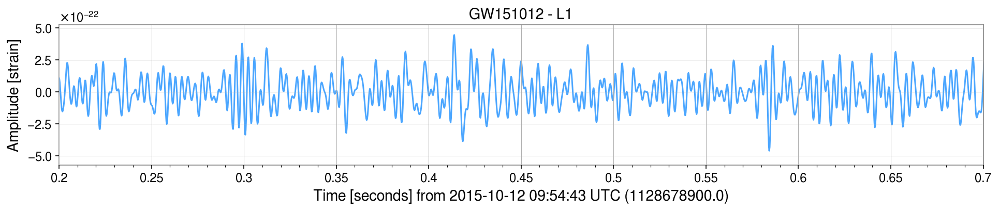

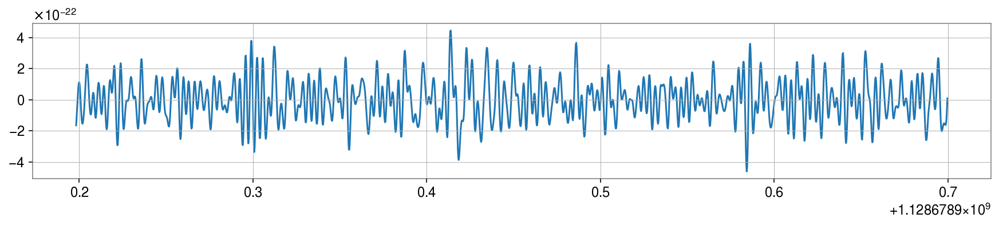

In [20]:
for i in [2,3]:
    s1 = clean_it_up(i, full_event_list, 75, 310) #70, 310
    L,R = plot_strain(i, full_event_list, s1, -0.2, 0.7) # -0.26, 0.6
    sL, sR = plot_check(s1, L, R )
    ev_name = '{}-{}'.format(full_event_list[i][1], full_event_list[i][3])
    the_interesting_data[ev_name] = [s1, L, R, sL, sR]
   


#### ✓ GW151226 H1 & L1
https://www.gw-openscience.org/eventapi/html/GWTC-1-confident/GW151226/v2/

INTERVAL IS:  0.499
INTERVAL IS:  0.499


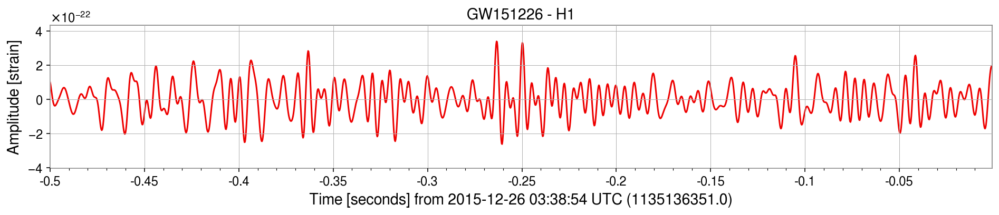

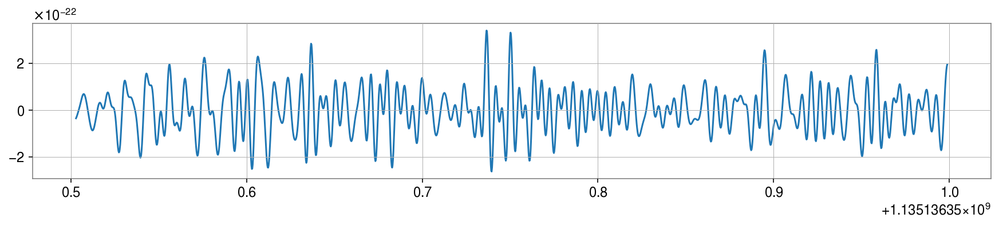

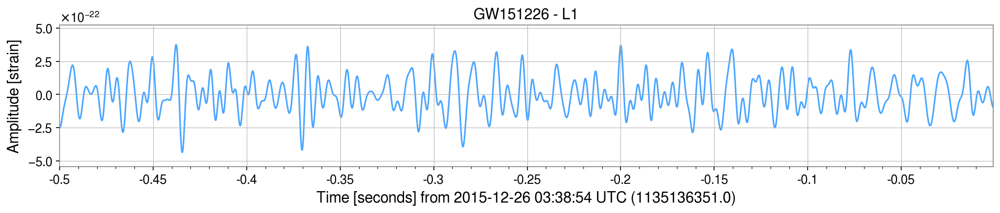

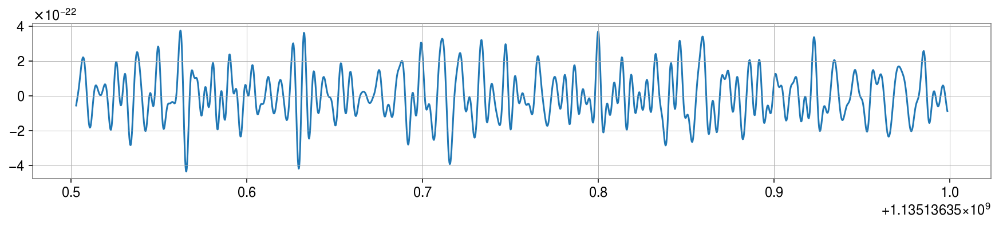

In [21]:
for i in [4,5]:
    s1 = clean_it_up(i, full_event_list, 60,230)  # 60, 230)
    L,R = plot_strain(i, full_event_list, s1, 0.5, -0.001)
    sL, sR = plot_check(s1, L, R,  shift_L=0.03, shift_R=0)
    ev_name = '{}-{}'.format(full_event_list[i][1], full_event_list[i][3])
    the_interesting_data[ev_name] = [s1, L, R, sL, sR]

#### ✓ GW170104 H1 & L1
[image.png](attachment:image.png)

INTERVAL IS:  0.58
INTERVAL IS:  0.58


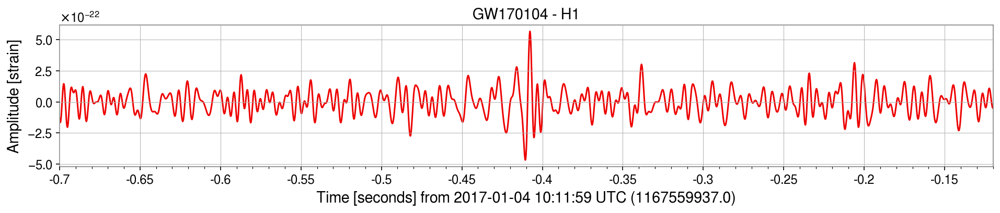

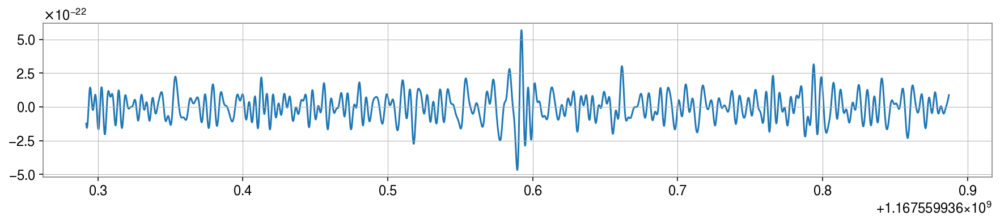

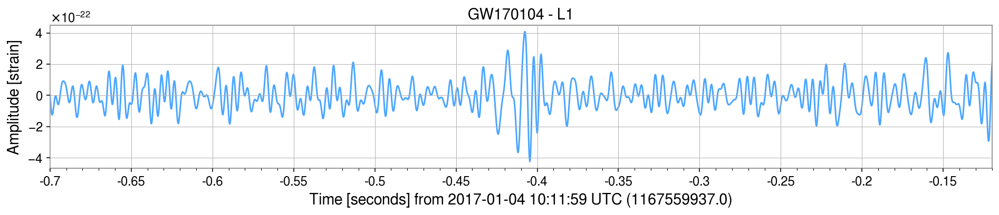

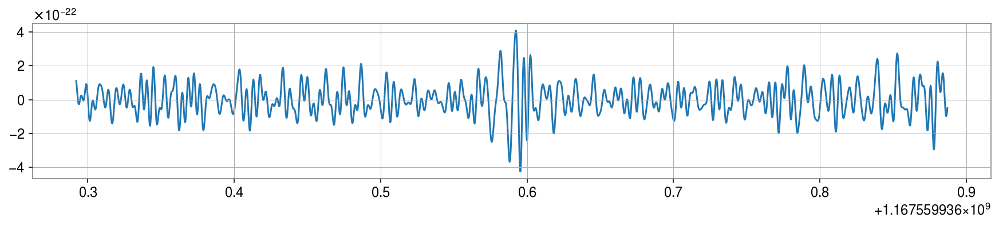

In [22]:
for i in [6,7]:
    s1 = clean_it_up(i, full_event_list, 60, 260)
    L,R = plot_strain(i, full_event_list, s1, 0.7, -0.12)
    sL, sR = plot_check(s1, L, R,  shift_L=0.055, shift_R=0)
    ev_name = '{}-{}'.format(full_event_list[i][1], full_event_list[i][3])
    the_interesting_data[ev_name] = [s1, L, R, sL, sR]

#### ✓ GW170608 H1 & L1
[image.png](attachment:image.png)

INTERVAL IS:  0.65
INTERVAL IS:  0.65


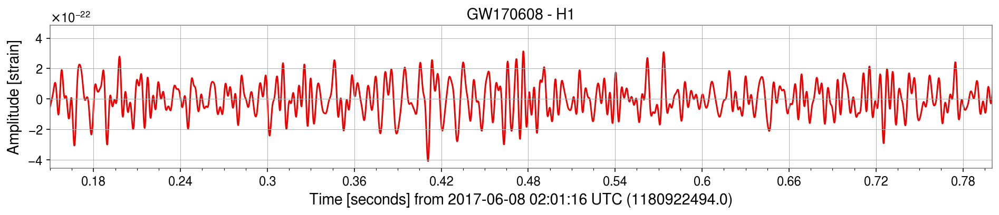

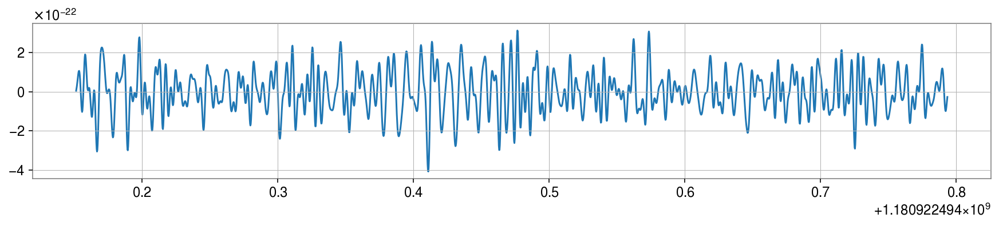

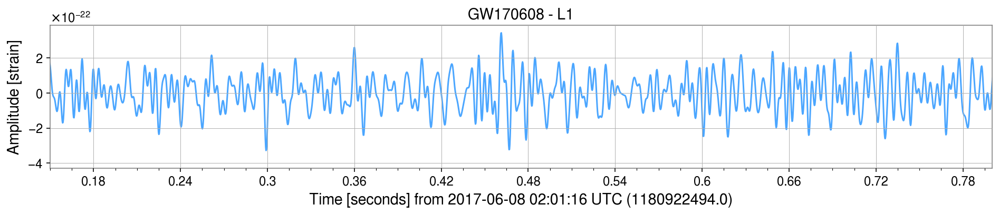

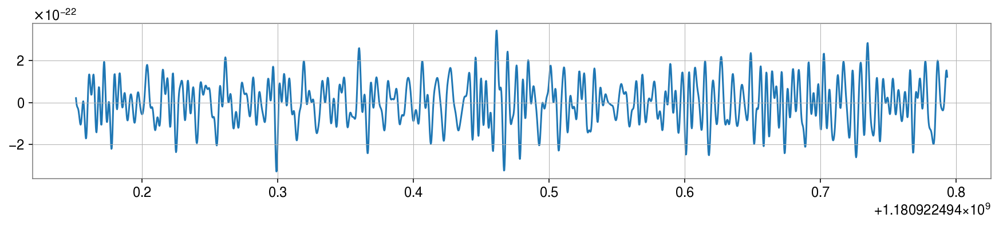

In [23]:
for i in [8,9]:
    s1 = clean_it_up(i, full_event_list, 50, 280) # 56, 180
    L,R = plot_strain(i, full_event_list, s1, -0.15, 0.8) # 0.15, 1
    sL, sR = plot_check(s1, L, R)
    ev_name = '{}-{}'.format(full_event_list[i][1], full_event_list[i][3])
    the_interesting_data[ev_name] = [s1, L, R, sL, sR]

#### ✓ GW170729 H1, L1 & V1

INTERVAL IS:  0.37
INTERVAL IS:  0.37


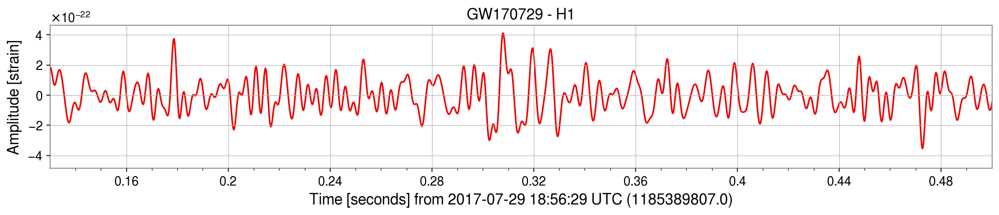

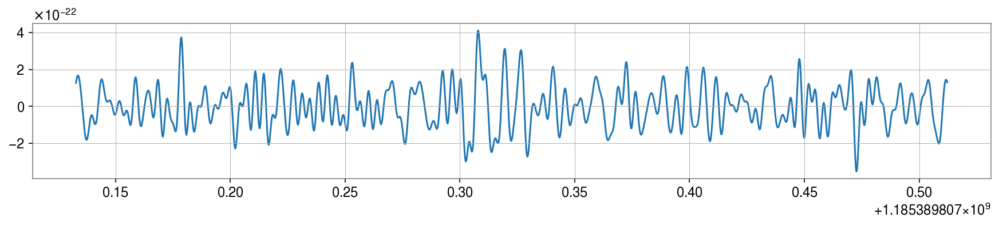

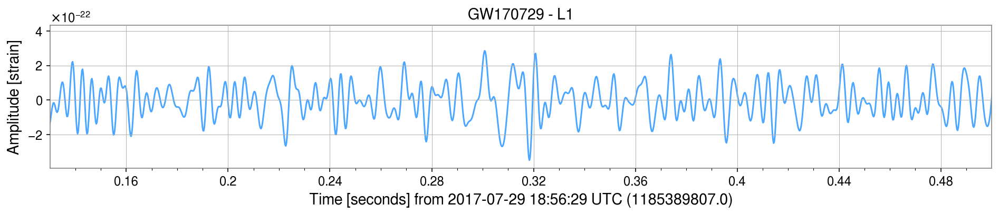

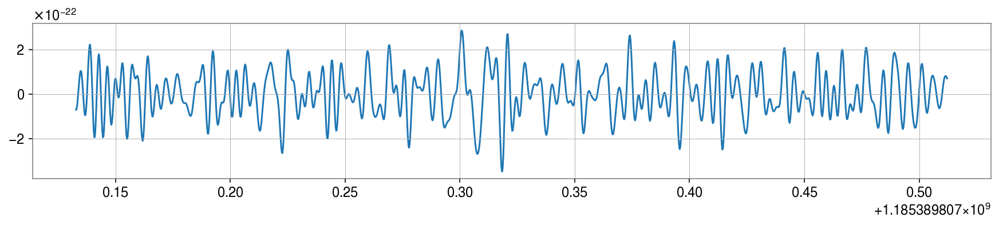

In [24]:
for i in [10,11]:
    s1 = clean_it_up(i, full_event_list, 60, 300)
    L,R = plot_strain(i, full_event_list, s1, -0.13, 0.5)
    sL, sR = plot_check(s1, L, R)
    ev_name = '{}-{}'.format(full_event_list[i][1], full_event_list[i][3])
    the_interesting_data[ev_name] = [s1, L, R, sL, sR]

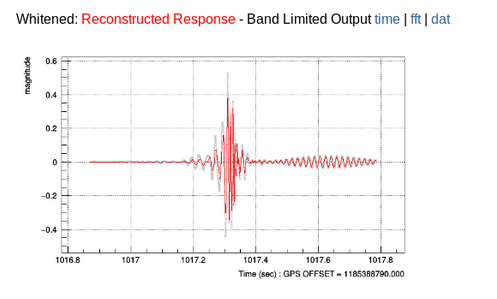
sauce: https://gwburst.gitlab.io/info/gw170729_ced_gwosc/

INTERVAL IS:  9.5


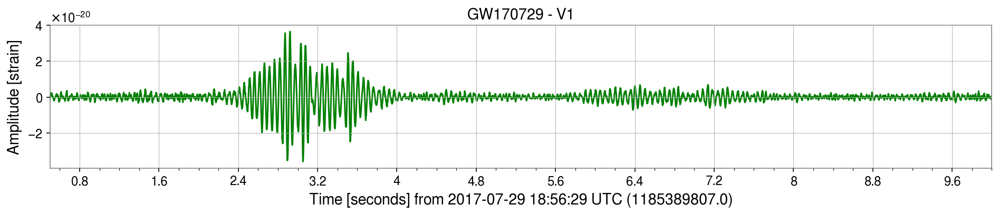

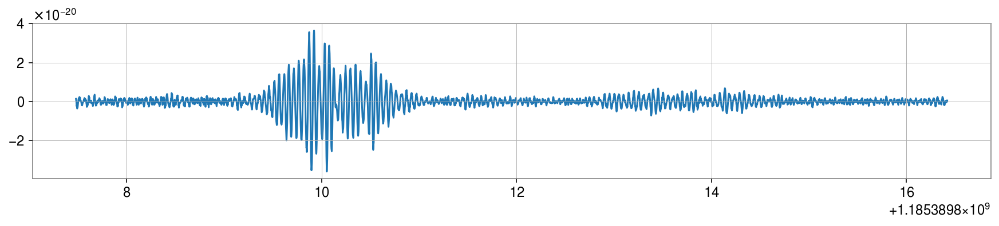

In [25]:
for i in [12]:
    s1 = clean_it_up(i, full_event_list, 19, 220) # 19, 250
    L,R = plot_strain(i, full_event_list, s1, -0.5, 10) #-0.5, 5
    sL, sR = plot_check(s1, L, R) # ,  shift_L=0.055, shift_R=0)
    ev_name = '{}-{}'.format(full_event_list[i][1], full_event_list[i][3])
    the_interesting_data[ev_name] = [s1, L, R, sL, sR]

#### ✓ GW170809 H1, L1 & V1
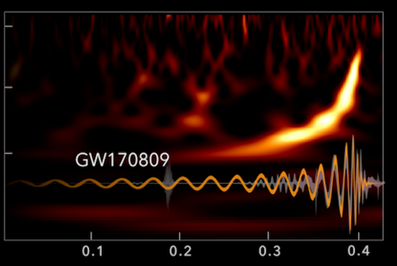

INTERVAL IS:  0.48
INTERVAL IS:  0.48


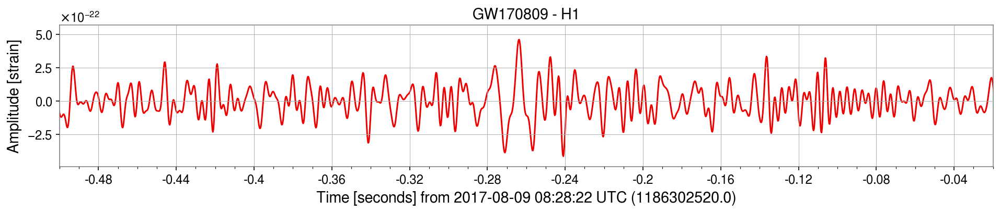

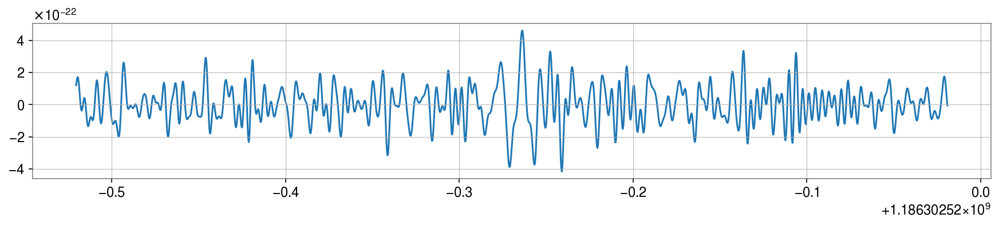

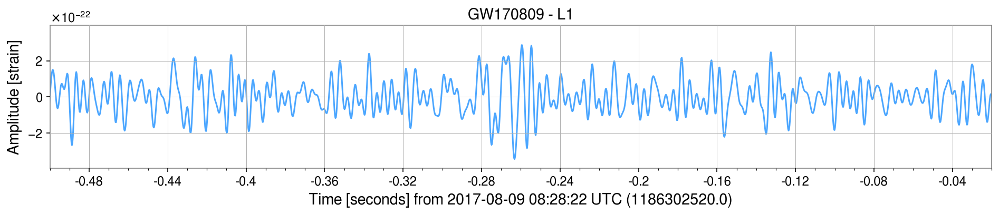

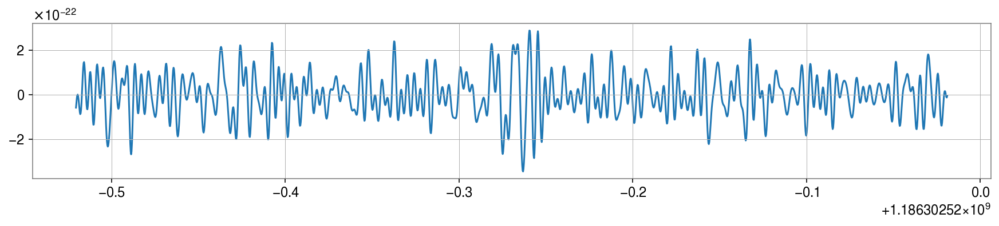

In [26]:
for i in [13,14]:
    s1 = clean_it_up(i, full_event_list, 56, 280)
    L,R = plot_strain(i, full_event_list, s1, 0.5, -0.02)
    sL, sR = plot_check(s1, L, R,  shift_L=0.055, shift_R=0)
    ev_name = '{}-{}'.format(full_event_list[i][1], full_event_list[i][3])
    the_interesting_data[ev_name] = [s1, L, R, sL, sR]

INTERVAL IS:  0.8999999999999986


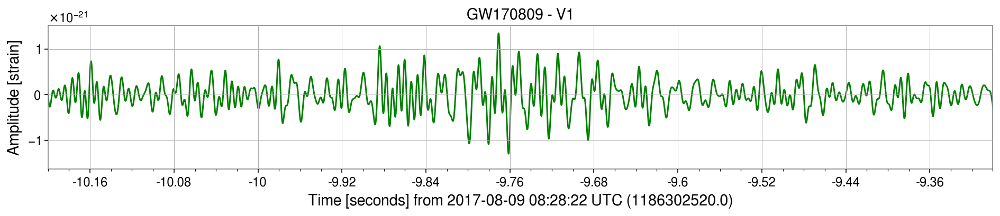

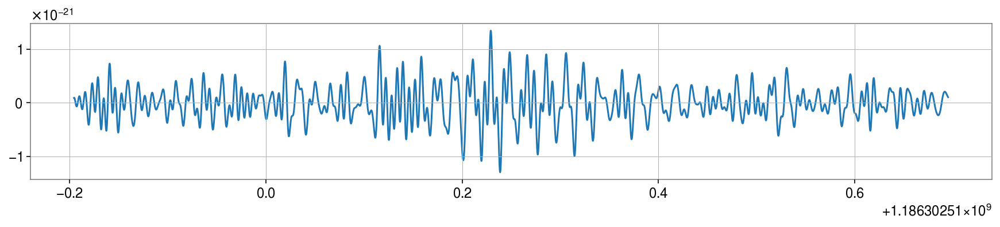

In [27]:
for i in [15]:
    s1 = clean_it_up(i, full_event_list, 50, 180)
    L,R = plot_strain(i, full_event_list, s1, 10.2, -9.3) # 10.5, -9.3
    sL, sR = plot_check(s1, L, R, shift_L=0.675, shift_R=0.625) # shift_L=0, shift_R=0) # ,  shift_L=0.1, shift_R=0)
    ev_name = '{}-{}'.format(full_event_list[i][1], full_event_list[i][3])
    the_interesting_data[ev_name] = [s1, L, R, sL, sR]

#### ✓ GW170814 L1 & V1
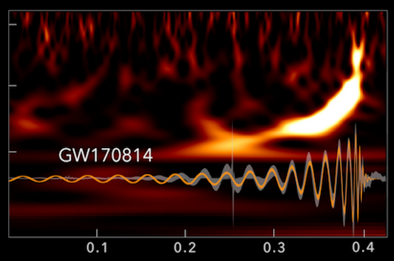

INTERVAL IS:  0.4500000000000002


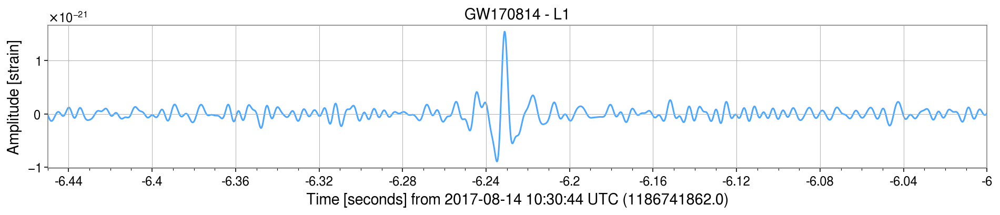

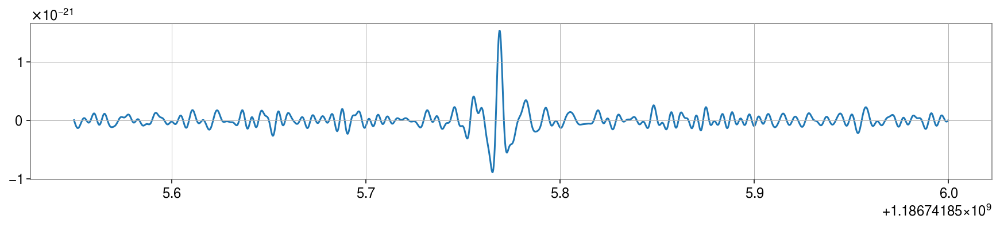

In [28]:
for i in [17]:
    s1 = clean_it_up(i, full_event_list, 56, 230)
    L,R = plot_strain(i, full_event_list, s1, 6.45, -6)
    sL, sR = plot_check(s1, L, R, shift_L=0.43, shift_R=0.4) # , shift_L=0.675, shift_R=0.625) # shift_L=0, shift_R=0) # ,  shift_L=0.1, shift_R=0)
    ev_name = '{}-{}'.format(full_event_list[i][1], full_event_list[i][3])
    the_interesting_data[ev_name] = [s1, L, R, sL, sR]

INTERVAL IS:  1.2999999999999998


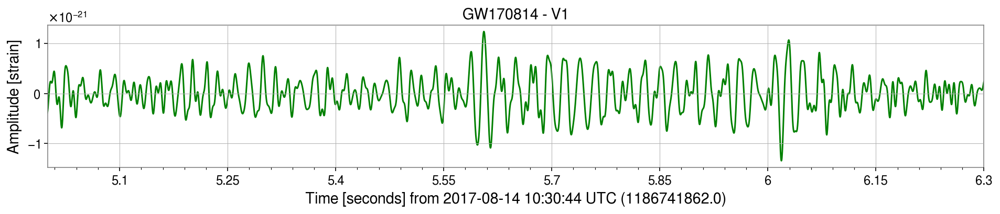

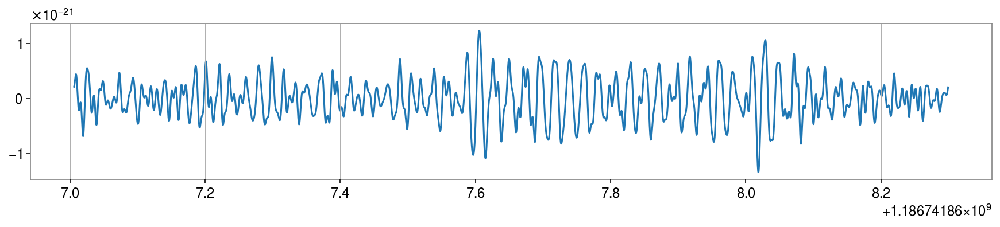

In [29]:
for i in [18]:
    s1 = clean_it_up(i, full_event_list, 44, 150) # 40, 130
    L,R = plot_strain(i, full_event_list, s1, -5, 6.3)
    sL, sR = plot_check(s1, L, R, shift_L=-0.34, shift_R=-0.42) # , shift_L=0.43, shift_R=0.4) # , shift_L=0.675, shift_R=0.625) # shift_L=0, shift_R=0) # ,  shift_L=0.1, shift_R=0)
    ev_name = '{}-{}'.format(full_event_list[i][1], full_event_list[i][3])
    the_interesting_data[ev_name] = [s1, L, R, sL, sR]

#### ✓ GW170817 L1 & V1
[image.png](attachment:image.png)

INTERVAL IS:  0.54


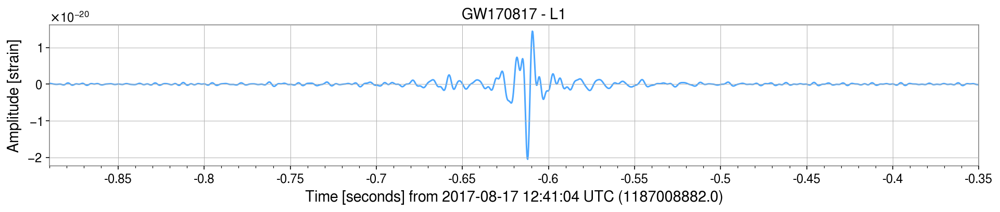

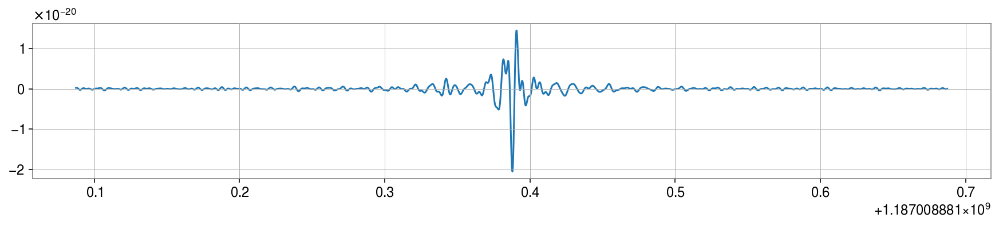

In [30]:
for i in [20]:
    s1 = clean_it_up(i, full_event_list, 80, 250)
    L, R = plot_strain(i, full_event_list, s1, 0.89, -0.35) # 0.89, -0.35
    sL, sR = plot_check(s1, L, R, shift_L=1.15, shift_R=1.05)
    ev_name = '{}-{}'.format(full_event_list[i][1], full_event_list[i][3])
    the_interesting_data[ev_name] = [s1, L, R, sL, sR]

INTERVAL IS:  0.8499999999999999


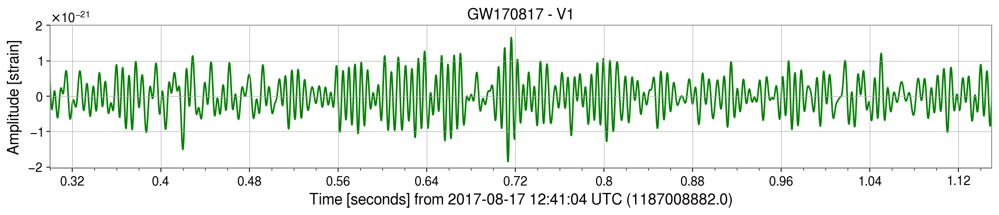

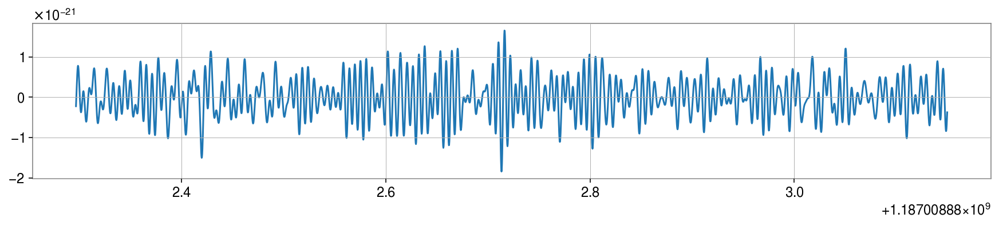

In [31]:
for i in [21]:
    s1 = clean_it_up(i, full_event_list, 56, 190)
    L,R = plot_strain(i, full_event_list, s1, -0.3, 1.15)
    sL, sR = plot_check(s1, L, R, shift_L=1.05, shift_R=0.99)
    ev_name = '{}-{}'.format(full_event_list[i][1], full_event_list[i][3])
    the_interesting_data[ev_name] = [s1, L, R, sL, sR]

#### ✓ GW170818 L1 & V1

INTERVAL IS:  1.0


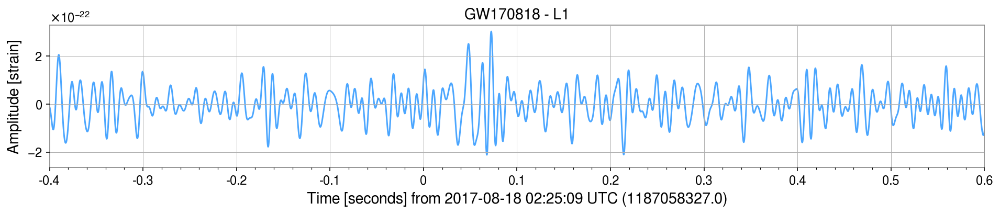

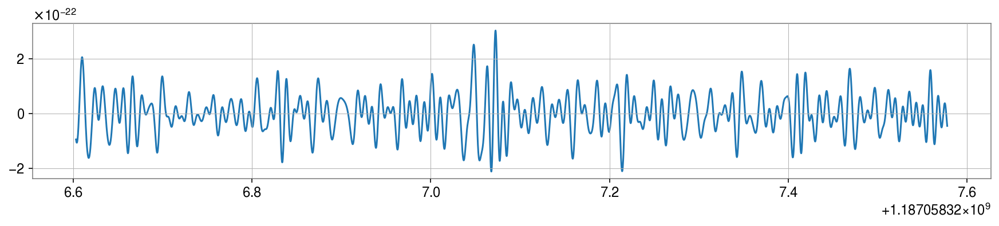

In [32]:
for i in [23]:
    s1 = clean_it_up(i, full_event_list, 40, 130)
    L,R = plot_strain(i, full_event_list, s1, 0.4, 0.6)
    sL, sR = plot_check(s1, L, R, shift_L=1.09, shift_R=1.05)
    ev_name = '{}-{}'.format(full_event_list[i][1], full_event_list[i][3])
    the_interesting_data[ev_name] = [s1, L, R, sL, sR]

[GW170818](https://www.gw-openscience.org/eventapi/html/GWTC-1-confident/GW170818/v1/) is a single detector event (V1) whose astrophysical origin [is contested](https://arxiv.org/abs/2008.00509)
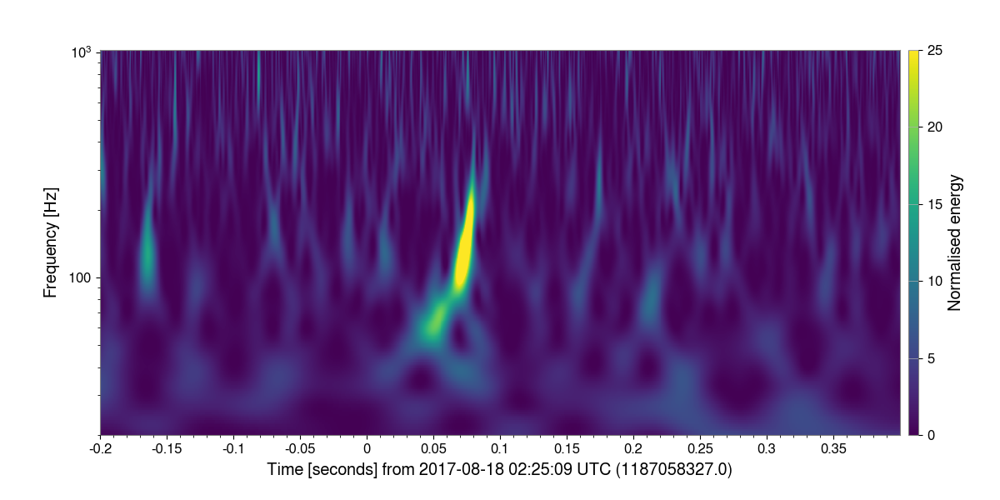

INTERVAL IS:  0.45


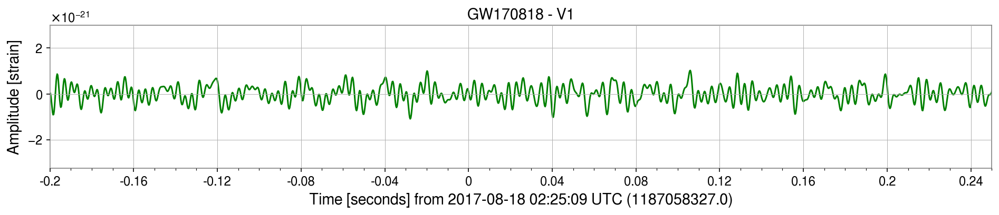

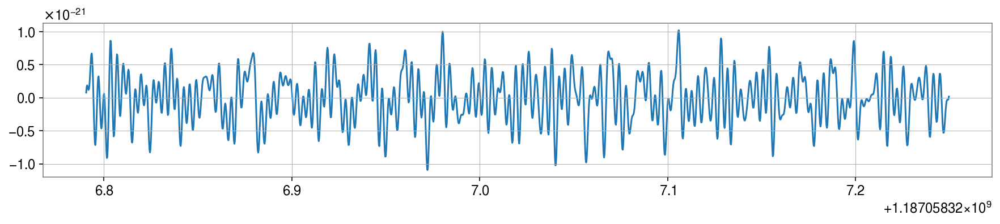

In [33]:
for i in [24]:
    s1 = clean_it_up(i, full_event_list, 44, 280)
#     s1 = clean_it_up(i, full_event_list, 50, 150)
    # L,R = plot_strain(i, full_event_list, s1, -12.6, 13.5)
    L,R = plot_strain(i, full_event_list, s1, 0.2, 0.25)
    sL, sR = plot_check(s1, L, R, shift_L=1.09, shift_R=1.05)
    ev_name = '{}-{}'.format(full_event_list[i][1], full_event_list[i][3])
    the_interesting_data[ev_name] = [s1, L, R, sL, sR]

#### ✓ GW190412 H1 & L1

INTERVAL IS:  0.8
INTERVAL IS:  0.8


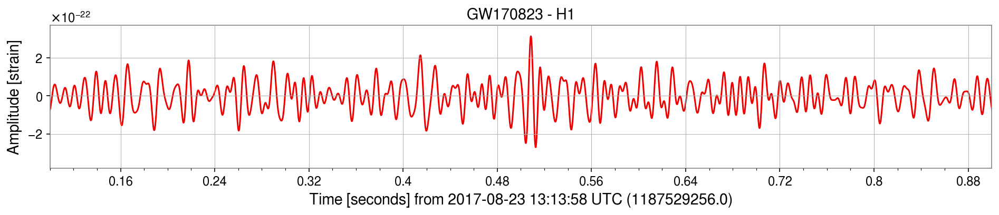

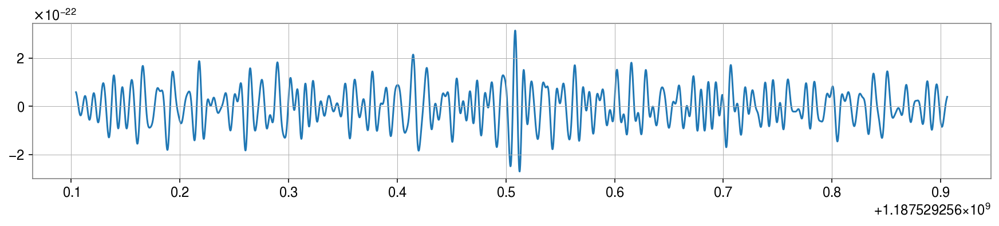

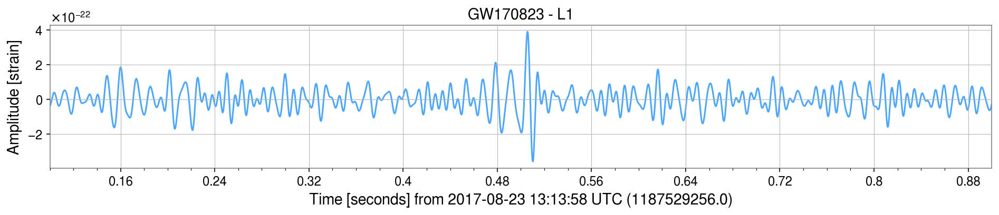

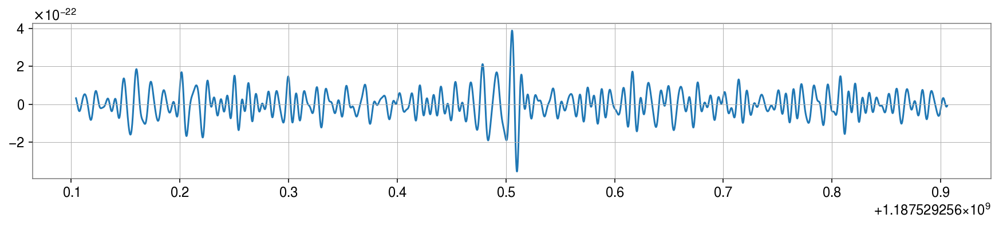

In [34]:
for i in [25,26]:
    s1 = clean_it_up(i, full_event_list, 56, 160)
    L,R = plot_strain(i, full_event_list, s1, -0.1, 0.9)
    sL, sR = plot_check(s1, L, R, shift_L=1.055, shift_R=1)
    ev_name = '{}-{}'.format(full_event_list[i][1], full_event_list[i][3])
    the_interesting_data[ev_name] = [s1, L, R, sL, sR]

In [35]:
#NB. we are ignoring [27], GW170823 - V1
# (something is wrong with the data)

#### ✓ GW190521 H1, L1 & V1

INTERVAL IS:  1.37
INTERVAL IS:  1.37


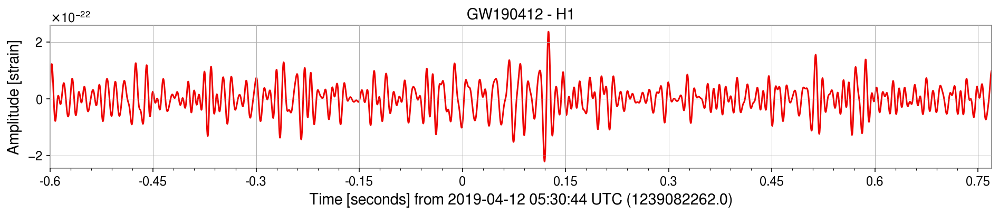

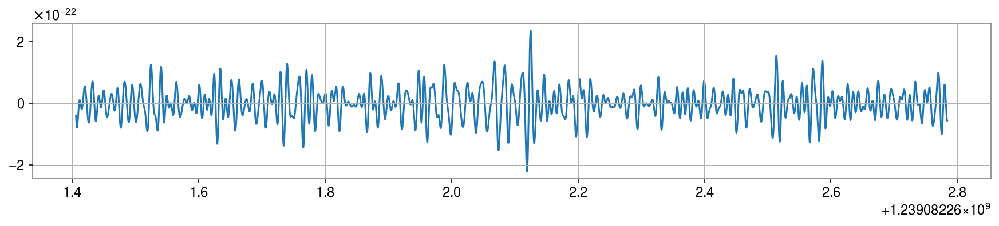

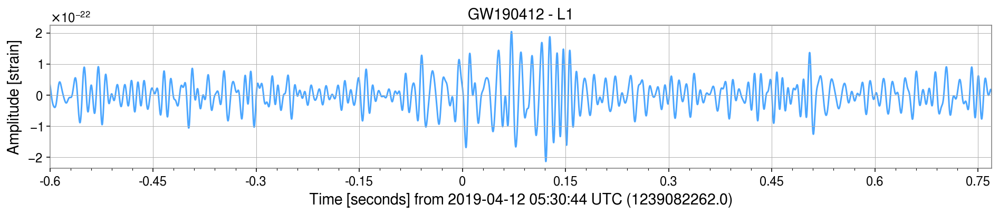

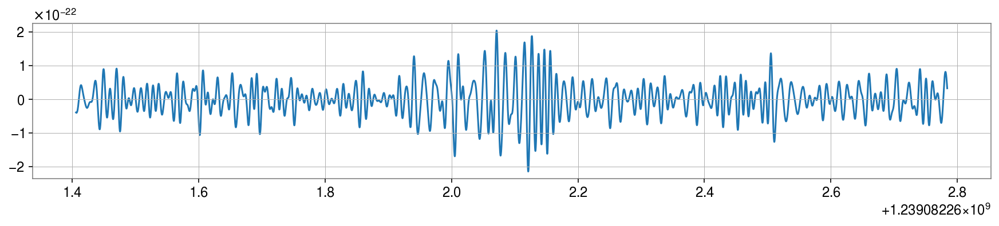

In [36]:
for i in [28,29]:
    s1 = clean_it_up(i, full_event_list, 50, 130)
    L,R = plot_strain(i, full_event_list, s1, 0.6, 0.77)
    sL, sR = plot_check(s1, L, R, shift_L=1.1, shift_R=1)
    ev_name = '{}-{}'.format(full_event_list[i][1], full_event_list[i][3])
    the_interesting_data[ev_name] = [s1, L, R, sL, sR]
   

#### ✓ GW190814 H1, L1 & V1

INTERVAL IS:  0.49999999999999994
INTERVAL IS:  0.49999999999999994


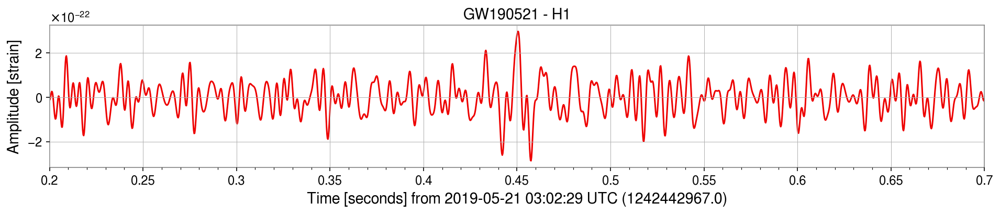

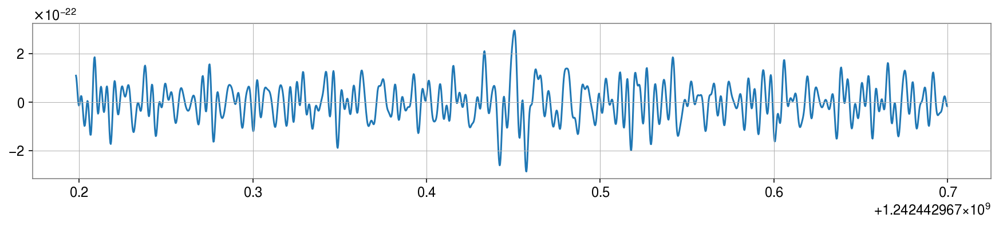

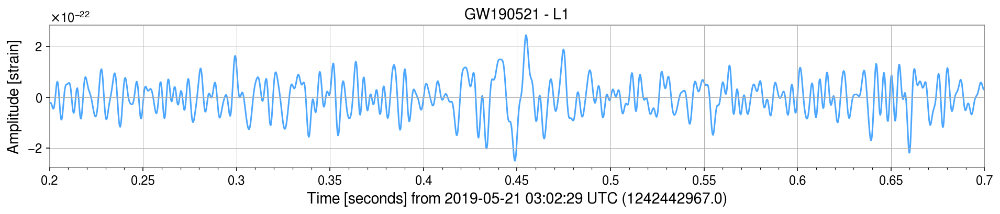

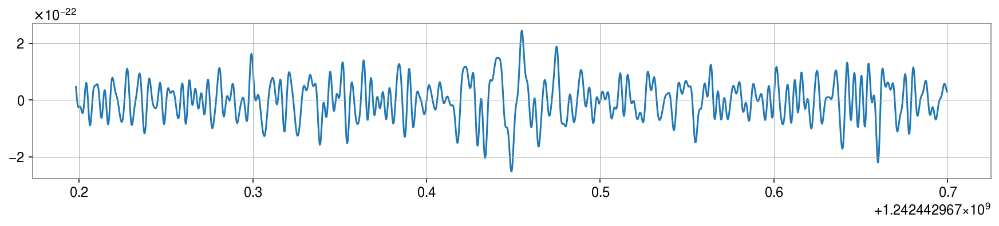

In [37]:
for i in [31,32]:
    s1 = clean_it_up(i, full_event_list, 56, 280)
    L,R = plot_strain(i, full_event_list, s1, -0.2, 0.7)
    sL, sR = plot_check(s1, L, R, shift_L=1.055, shift_R=1.02)
    ev_name = '{}-{}'.format(full_event_list[i][1], full_event_list[i][3])
    the_interesting_data[ev_name] = [s1, L, R, sL, sR]

# TimeSeries --> Joy division style

To convert the TimeSeries data into joyplots, we need to:
- Select a filtered strain data
- apply a crop to the section of interest
- save the cropped & filtered strain data (always the same # of points)
- save all of them to a dataframe

The relevant strain data is in:  
- TimeSeries.value (array of strains)
- time center of series: `ts.t0+ts.dt*len(ts.value)/2` (if we call `ts` our filtered time series)


# Preparing data to Plot

### Sub-sampling

Not all data has the same number of points (since some of the interesting signals are longer in time).  To plot all the data on the same X-axis, we are going to require all signals to have the same number of points.  We will chose about 1200, which is the lowest number of points in one of the events.  For the ones with higher number of points (up to ~5000) we will downsample the graphs.

https://stackoverflow.com/questions/53307107/how-do-i-downsample-a-1d-numpy-array


In [43]:
from scipy import signal

In [44]:
down_data = the_interesting_data # rename so as to not overwrite
N_max = 1500 # max # of points to plot curve (based on time-series with least # of points)
total_nr_points = len(down_data["GW150914-H1"][0].value)

a_sec = int(total_nr_points/32)
middle = int(total_nr_points/2)

In [45]:
# downsample data in-place for the list
final_data = {}
for k, v in down_data.items():
    
    # we need to slightly shift the cutoff values we 
    # identified, because the plot function for Timeseries objects
    # and the plot function for matplotlib are slightly shifted
    # compared to each other
    L = v[1] # left cutoff
    R = v[2] # right cutoff
    sL = v[3] # left shift
    sR = v[4] # right shift
    
    start_e = int(middle - a_sec*L - a_sec*sL)
    end_e = int(middle + a_sec*R - a_sec*sR)
    
    interesting = v[0][start_e:end_e]
    down_interesting = signal.resample(interesting, N_max)
    final_data[k] = down_interesting # <- the cropped & down-sampled time series

## All time-series now have the same # of points

In [46]:
df = pd.DataFrame(final_data)

# Save dataframe to CSV
from datetime import date
td = date.today()
df.to_csv(str(td) + "-ligo_df_processed_cropped_downsampled.csv")

### Some strains are much larger than others ($10^{-20} \; \mathrm{vs.} \; 10^{-22}$)

In [47]:
df.max()

GW150914-H1    9.351974e-22
GW150914-L1    5.832120e-22
GW151012-H1    4.364585e-22
GW151012-L1    4.443924e-22
GW151226-H1    3.403478e-22
GW151226-L1    3.721473e-22
GW170104-H1    5.558049e-22
GW170104-L1    4.082395e-22
GW170608-H1    3.074278e-22
GW170608-L1    3.442192e-22
GW170729-H1    4.137667e-22
GW170729-L1    2.857783e-22
GW170729-V1    3.572151e-20
GW170809-H1    4.598400e-22
GW170809-L1    2.870688e-22
GW170809-V1    1.346915e-21
GW170814-L1    1.543435e-21
GW170814-V1    1.230418e-21
GW170817-L1    1.450055e-20
GW170817-V1    1.634311e-21
GW170818-L1    3.023168e-22
GW170818-V1    1.011256e-21
GW170823-H1    3.135908e-22
GW170823-L1    3.871466e-22
GW190412-H1    2.322084e-22
GW190412-L1    2.043906e-22
GW190521-H1    2.965158e-22
GW190521-L1    2.438059e-22
dtype: float64

## We will normalize the Virgo data so it's not ~ 50x "taller"

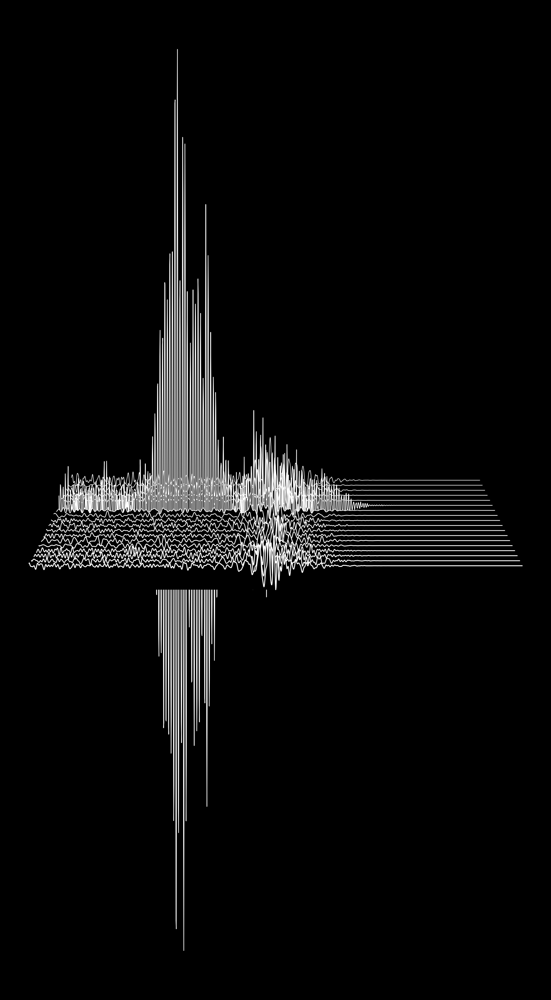

In [49]:
# normalized datatrame (ndf)
ndf = df.copy()

In [50]:
tall_ones = ["GW170729-V1", "GW170817-L1"] # , "GW170814-V1", "GW170817-V1", "GW170818-V1"]
for x in tall_ones:
    maxi = ndf[x].max()
    # the 6e-22 is chosen as one of the larger values in the normal data 
    down_factor = (6e-22/maxi)
    ndf[x] = ndf[x].apply(lambda x: x * down_factor)

### Normalize data to avoid dragging around the $10^{-22}$ factors later

In [51]:
normalized_data = ndf * 0.4*10e22
normalized_data.to_csv("normalized_ligo_data.csv")